## Imports

In [22]:
%load_ext autoreload
%autoreload 2

# Standard imports
import glob

# 3rd party imports
import cv2
import matplotlib.pyplot as plt
import numpy as np 
from pprint import pprint
import SimpleITK as sitk
sitk.ProcessObject_SetGlobalWarningDisplay(False)
from scipy import ndimage

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Functions

In [23]:
### Functions for IO operations
def load_channels(filepath: str, idx: int) -> np.ndarray:
    """
    Load the image channels from the given filepath.
    
    Args:
        filepath: str, path to the image
        idx: int, index of the image to load
        
    Returns:
        channels: np.ndarray, image channels
    """
    filepaths = sorted(glob.glob(filepath))
    print(f"Found {int(len(filepaths)/2)} slices")
    pprint(filepaths)
    
    # Load the image
    file_idx = idx * 2  # Multiply by 2 because we have 2 channels and they're stored in pairs
    curr_img = (read_tif(filepaths[file_idx]), read_tif(filepaths[file_idx + 1]))
    print("\nCh1:", filepaths[file_idx])
    print("Ch2:", filepaths[file_idx + 1])
    curr_ch1 = curr_img[0]
    curr_ch2 = curr_img[1]

    # Check image stats
    print(f"\nChannel shape: {curr_ch1.shape}")
    print(f"Channel dtype: {curr_ch1.dtype}")
    print(f"Channel 1 min: {curr_ch1.min()}")
    print(f"Channel 1 max: {curr_ch1.max()}")
    print(f"Channel 1 mean: {curr_ch1.mean()}")
    
    return curr_ch1, curr_ch2


def read_tif(filepath):
    """
    Read tiff files using SimpleITK
    
    Args:
        filepath: str, path to tiff file
        
    Returns:
        image: np.ndarray, tiff image
    """
    image = sitk.ReadImage(filepath)
    image = sitk.GetArrayFromImage(image)
    return image


def auto_contrast(data: np.ndarray, alpha: float = None, beta: float = None) -> np.ndarray:
    """
    Preprocess tiff files to automatically adjust brightness and contrast.
    https://stackoverflow.com/questions/56905592/automatic-contrast-and-brightness-adjustment-of-a-color-photo-of-a-sheet-of-pape
    """
    if not alpha:
        alpha = np.iinfo(data.dtype).max / (np.max(data) - np.min(data))
    if not beta:
        beta = -np.min(data) * alpha
    img = cv2.convertScaleAbs(data.copy(), alpha=alpha, beta=beta)
    return img


def gamma_correction(image: np.ndarray, gamma: float=2.0) -> np.ndarray:
    """
    Apply gamma correction to the image.
    
    Args:
        image: np.ndarray, input image
        gamma: float, gamma value
        
    Returns:
        image_enhanced: np.ndarray, gamma corrected image
    """
    # Normalize the image to the range [0, 1]
    image_normalized = image / image.max()
    # Apply the exponential transformation
    image_enhanced = np.power(image_normalized, gamma)
    # Rescale the image back to the original intensity range
    image_enhanced = image_enhanced * image.max()
    return image_enhanced


def save_figure(image, filename, contours=None):
    """
    Save figure to disk.
    
    Args:
        image: np.ndarray, input image
        filename: str, path to save the image
        contours: np.ndarray, contours to overlay on the image
    """
    plt.figure(figsize=(20, 20))
    plt.imshow(image, cmap='gray')
    if contours is not None:
        plt.contour(contours, colors='red', linewidths=0.15, alpha=0.35)
    plt.axis('off')
    plt.savefig(filename, dpi=600, bbox_inches='tight')
    print(f"Saved figure to {filename}")
    
    
def show(image: np.ndarray, contour: np.ndarray = None,
         image2: np.ndarray = None, contour2: np.ndarray = None, contour_alpha: float = 0.75,
         title: str = "", title2: str = "", 
         xlim: tuple[int, int] = None, ylim: tuple[int, int] = None,
         xlim2: tuple[int, int] = None, ylim2: tuple[int, int] = None,
         axis: bool = True,
         figsize: tuple[int, int] = (10, 10)):
    """
    Display the image.
    
    Args:
        image: np.ndarray, input image
        title: str, title of the image
    """
    f = plt.figure(figsize=figsize)
    # If there are two images, display them side by side
    if image2 is not None:
        plt.subplot(1, 2, 1)
        plt.imshow(image, cmap='gray')
        plt.title(title)
        if contour is not None:
            plt.contour(contour, colors='red', linewidths=0.5, alpha=contour_alpha)
        if xlim is not None:
            plt.xlim(xlim)
        if ylim is not None:
            plt.ylim(ylim)
        plt.axis(axis)
        plt.subplot(1, 2, 2)
        plt.imshow(image2, cmap='gray')
        plt.title(title2)
        if contour2 is not None:
            plt.contour(contour2, colors='red', linewidths=0.5, alpha=contour_alpha)
        if xlim2 is not None:
            plt.xlim(xlim2)
        if ylim2 is not None:
            plt.ylim(ylim2)
        plt.axis(axis)
    # If there is only one image, display it
    else:
        plt.imshow(image, cmap='gray')
        plt.title(title)
        if contour is not None:
            plt.contour(contour, colors='red', linewidths=0.5, alpha=contour_alpha)
        if xlim is not None:
            plt.xlim(xlim)
        if ylim is not None:
            plt.ylim(ylim)
        plt.axis(axis)
    plt.show()
    f.clear()
    plt.close(f)
    
    

In [24]:
### Functions for vessel detection
import itk
import numpy as np
from skimage.morphology import remove_small_objects, binary_closing, disk, remove_small_holes

# Parameters for vessel detection
ALPHA = 0.5  # Default 0.5
BETA = 0.5  # Default 1
GAMMA = 5.0  # Default 5

def detect_vessels(input_image: np.ndarray, min_sigma: float=1.0, max_sigma: float=10.0, num_steps: int=10):
    """
    Use the Hessian-based vesselness filter to detect vessels in the image.
    
    Args:
        input_image: np.ndarray, input image
        min_sigma: float, minimum sigma value
        max_sigma: float, maximum sigma value
        num_steps: int, number of steps
        
    Returns:
        segmented_vessels_array: np.ndarray, segmented vessels
    """
    # Run ITK
    input_image = itk.image_from_array(input_image)
    #input_image = itk.imread(input_image, itk.F)

    ImageType = type(input_image)
    Dimension = input_image.GetImageDimension()
    HessianPixelType = itk.SymmetricSecondRankTensor[itk.D, Dimension]
    HessianImageType = itk.Image[HessianPixelType, Dimension]

    objectness_filter = itk.HessianToObjectnessMeasureImageFilter[
        HessianImageType, ImageType
    ].New()
    objectness_filter.SetBrightObject(False)  # Set to True if the structures are bright on a dark background
    objectness_filter.SetScaleObjectnessMeasure(False)  # Set to True to scale the objectness measure by the scale
    objectness_filter.SetAlpha(ALPHA)  # Sensitivity to blob-like structures
                                     # Set/Get Alpha, the weight corresponding to R_A 
                                     # (the ratio of the smallest eigenvalue that has to be large to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetBeta(BETA)   # Sensitivity to plate-like structures - 1.0 default
                                     # Set/Get Beta, the weight corresponding to R_B 
                                     # (the ratio of the largest eigenvalue that has to be small to the larger ones). 
                                     # Smaller values lead to increased sensitivity to the object dimensionality.
    objectness_filter.SetGamma(GAMMA)  # Sensitivity to noise - 5.0 default
                                     # Set/Get Gamma, the weight corresponding to S 
                                     # (the Frobenius norm of the Hessian matrix, or second-order structureness)

    multi_scale_filter = itk.MultiScaleHessianBasedMeasureImageFilter[
        ImageType, HessianImageType, ImageType
    ].New()
    multi_scale_filter.SetInput(input_image)
    multi_scale_filter.SetHessianToMeasureFilter(objectness_filter)
    multi_scale_filter.SetSigmaStepMethodToLogarithmic()
    multi_scale_filter.SetSigmaMinimum(min_sigma)
    multi_scale_filter.SetSigmaMaximum(max_sigma)
    multi_scale_filter.SetNumberOfSigmaSteps(num_steps)

    OutputPixelType = itk.UC
    OutputImageType = itk.Image[OutputPixelType, Dimension]

    rescale_filter = itk.RescaleIntensityImageFilter[ImageType, OutputImageType].New()
    rescale_filter.SetInput(multi_scale_filter)
    rescale_filter.Update()

    # Get numpy array
    segmented_vessels = rescale_filter.GetOutput()
    segmented_vessels_array = itk.array_view_from_image(segmented_vessels)
    segmented_vessels_array = np.asarray(segmented_vessels_array, dtype=np.float32)
    return segmented_vessels_array


def process_vessels(vessel_image: np.ndarray, thresh: int, min_size: int=10, area_threshold: float=2000, smoothing: int=3):
    """
    Process the thresholded vessels.
    
    Args:
        vessel_image: np.ndarray, input image
        thresh: int, threshold value
        min_size: int, minimum size
        area_threshold: float, area threshold
        smoothing: int, smoothing factor
        
    Returns:
        thresholded_vessels: np.ndarray, thresholded vessels
    """
    # Process the thresholded vessels
    thresholded_vessels = vessel_image > thresh
    thresholded_vessels = np.invert(thresholded_vessels)

    # Get rid of small objects
    thresholded_vessels = remove_small_objects(thresholded_vessels, min_size=min_size)
    thresholded_vessels = remove_small_holes(thresholded_vessels, area_threshold=area_threshold)

    # Smoothen edges
    thresholded_vessels = binary_closing(thresholded_vessels, footprint=disk(smoothing))
    
    return thresholded_vessels


def get_brain_mask(brain_image, area_threshold=300000, min_size=10000):
    """
    Get the mask of the brain from the image (run before contrast enhancement).
    
    Args:
        brain_image: np.ndarray, input image
        thresh: int, threshold value
        area_threshold: int, area threshold
        
    Returns:
        mask: np.ndarray, mask of the brain
    """
    _, mask = cv2.threshold(brain_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_TRIANGLE)
    mask = remove_small_holes(mask.astype(bool), area_threshold=area_threshold)
    mask = remove_small_objects(mask, min_size=min_size)
    return mask


In [25]:
### Functions for evaluation
import csv
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
from scipy.spatial.distance import hamming

def dice_coefficient(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the Dice coefficient between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - dice: Dice coefficient.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    size1 = np.sum(binary_image1)
    size2 = np.sum(binary_image2)
    
    dice = (2. * intersection + epsilon) / (size1 + size2 + epsilon)
    return dice


def iou(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the Intersection over Union (IoU) between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - iou: IoU.
    """
    intersection = np.sum(binary_image1 * binary_image2)
    union = np.sum(binary_image1 + binary_image2)
    
    if union == 0:
        iou = 1.0
    
    iou = (intersection + epsilon) / (union + epsilon)
    return iou


def precision(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the precision between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - precision: Precision.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    
    precision = (true_positives) / (true_positives + false_positives + epsilon)
    return precision


def recall(binary_image1, binary_image2, epsilon=1e-10):
    """
    Compute the recall between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - recall: Recall.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    
    recall = true_positives / (true_positives + false_negatives + epsilon)
    return recall


def rand_index(binary_image1, binary_image2):
    """
    Compute the Rand index between two binary images.
    
    Parameters:
    - binary_image1: First binary image (numpy array).
    - binary_image2: Second binary image (numpy array).
    
    Returns:
    - rand_index: Rand index.
    """
    true_positives = np.sum(binary_image1 * binary_image2)
    false_positives = np.sum(binary_image1 * (1 - binary_image2))
    false_negatives = np.sum((1 - binary_image1) * binary_image2)
    true_negatives = np.sum((1 - binary_image1) * (1 - binary_image2))
    
    rand_index = (true_positives + true_negatives) / (true_positives + false_positives + false_negatives + true_negatives)
    return rand_index

## Load data

In [42]:
# IO parameters
filepath = "/media/data/u01/Fig4-2/4b-M72/*/*.tif"
IDX = 3

# Load the image channels
curr_ch1, curr_ch2 = load_channels(filepath, IDX)
curr_ch1 = curr_ch1.astype(np.float32)
curr_ch2 = curr_ch2.astype(np.float32)

Found 4 slices
['/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif']


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.



Ch1: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif
Ch2: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif

Channel shape: (8542, 15202)
Channel dtype: uint16
Channel 1 min: 0
Channel 1 max: 65535
Channel 1 mean: 3927.295233053076


Apply processing on the images and retrieve background mask

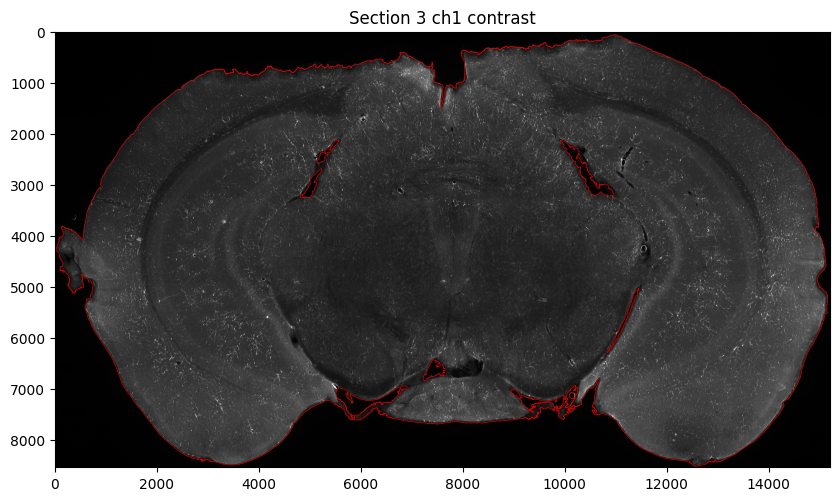

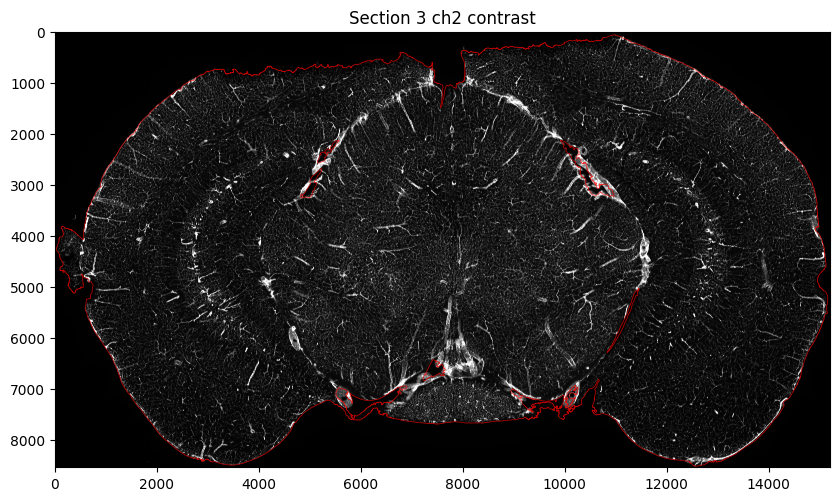

In [43]:
# Ch1 settings
gamma_ch1 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch1 = 0.01  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default

# Ch1 settings
gamma_ch2 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch2 = 0.006  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default


# No change
contrast_ch1 = curr_ch1
contrast_ch2 = curr_ch2

cc_ch1 = auto_contrast(contrast_ch1, alpha=contrast_alpha_ch1)
cc_ch2 = auto_contrast(contrast_ch2, alpha=contrast_alpha_ch2)

# Compute the original image contrast
#contrast_ch0 = gamma_correction(curr_ch0, gamma=gamma_ch0)
#contrast_ch0 = auto_contrast(contrast_ch0, alpha=contrast_alpha_ch0)
#contrast_ch1 = gamma_correction(curr_ch1, gamma=gamma_ch1)
#contrast_ch1 = auto_contrast(contrast_ch1, alpha=contrast_alpha_ch1)
#contrast_ch2 = gamma_correction(curr_ch2, gamma=gamma_ch2)
#contrast_ch2 = auto_contrast(contrast_ch2, alpha=contrast_alpha_ch2)

#bg_mask = gamma_correction(curr_ch0, gamma=gamma_ch0)
if IDX == 99999: 
    bg_alpha = 0.1
else:
    bg_alpha = 0.2  # 7 all but 3
bg_mask = auto_contrast(curr_ch1, alpha=bg_alpha)  # 7
bg_mask = get_brain_mask(bg_mask, area_threshold=25000)  # 255 default ch0, 150 for ch1

show(cc_ch1, bg_mask, title=f"Section {IDX} ch1 contrast", axis=True)
show(cc_ch2, bg_mask, title=f"Section {IDX} ch2 contrast", axis=True)

In [44]:
# Setup FOVs
fovs = [ 
    # xlim,             ylim
    ( (4000, 5000),     (4000, 5000) ),
    ( (2000, 3000),     (2000, 4000) ),
    ( (2000, 4000),     (4000, 6000) ),
    ( (5000, 6000),     (2000, 4000) ),
    ( (5000, 6000),     (1000, 2000) ),
    ( (5000, 6000),     (4000, 5000) ),
]

fov1_xlim, fov1_ylim = fovs[0][0], fovs[0][1][::-1]
fov2_xlim, fov2_ylim = fovs[1][0], fovs[1][1][::-1]
fov3_xlim, fov3_ylim = fovs[2][0], fovs[2][1][::-1]
fov4_xlim, fov4_ylim = fovs[3][0], fovs[3][1][::-1]
fov5_xlim, fov5_ylim = fovs[4][0], fovs[4][1][::-1]
fov6_xlim, fov6_ylim = fovs[5][0], fovs[5][1][::-1]

## Threshold for CH1 and CH2

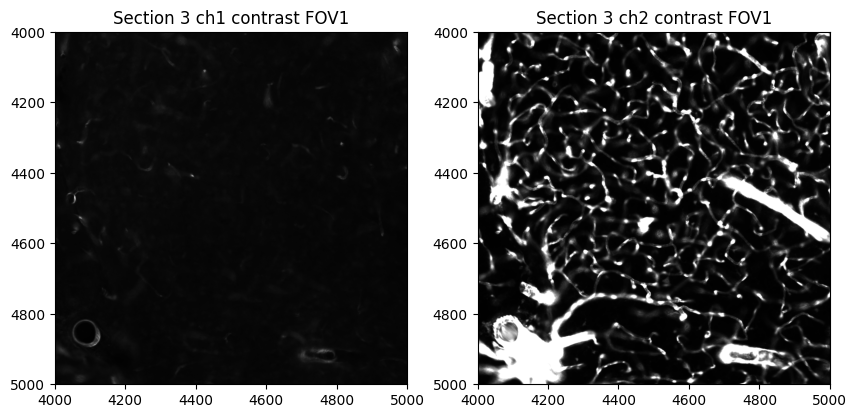

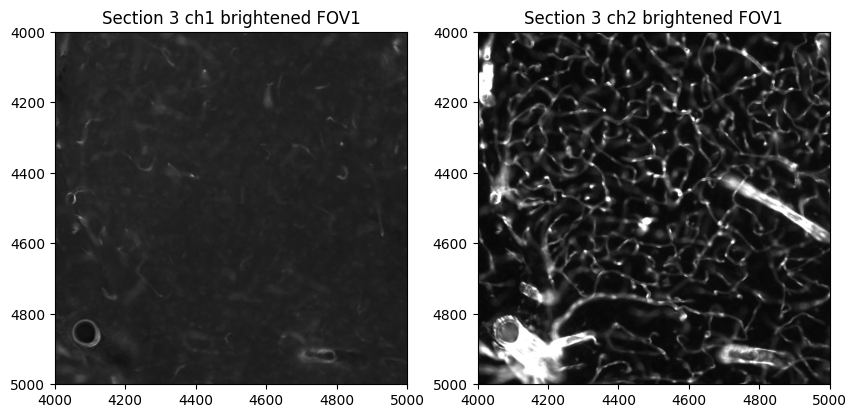

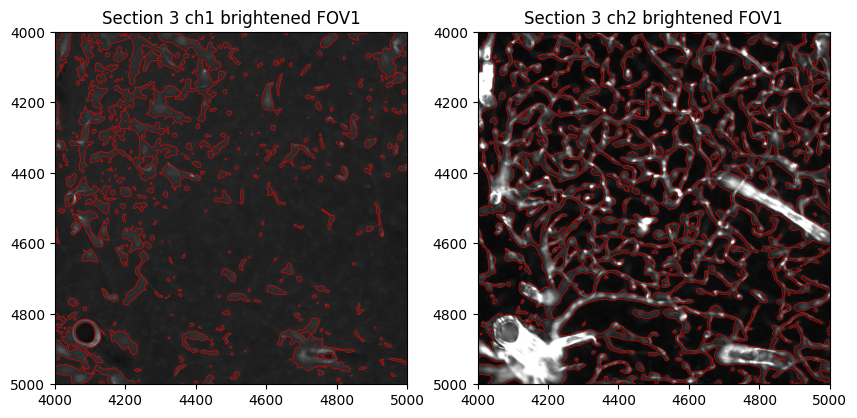

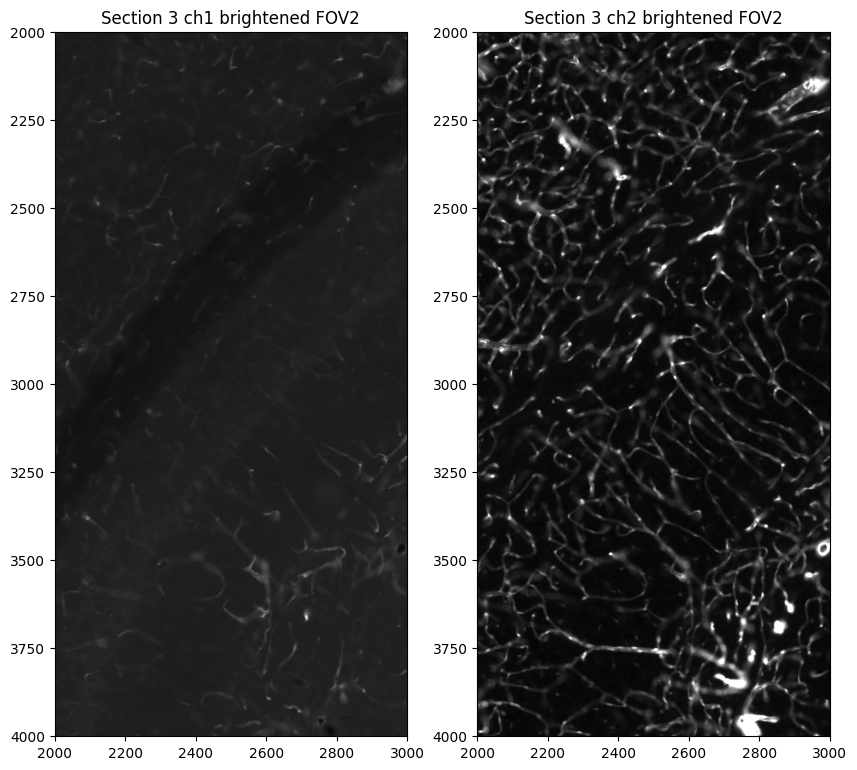

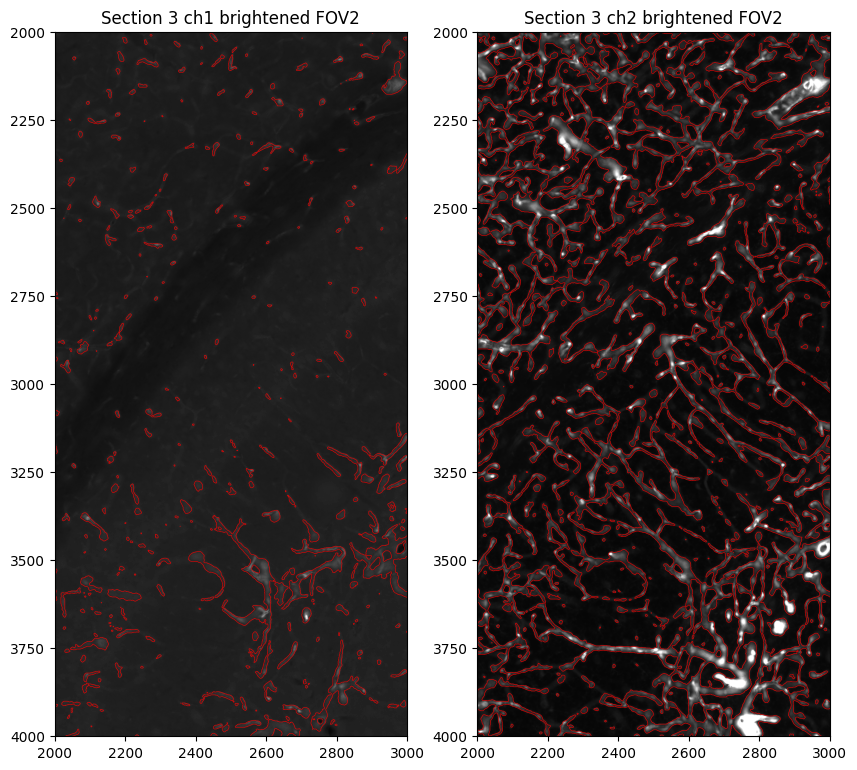

...

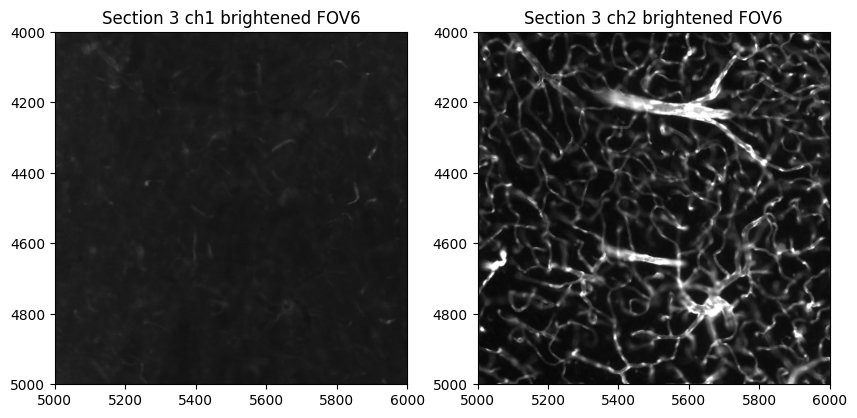

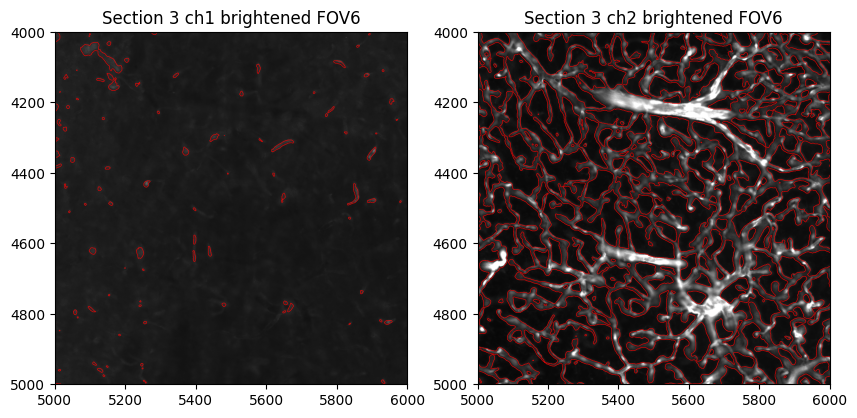

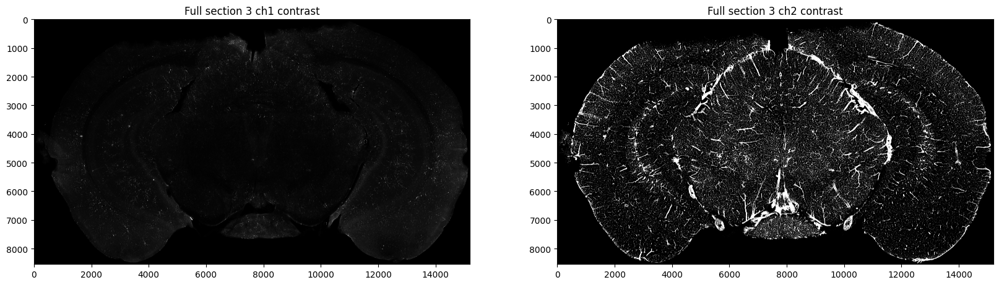

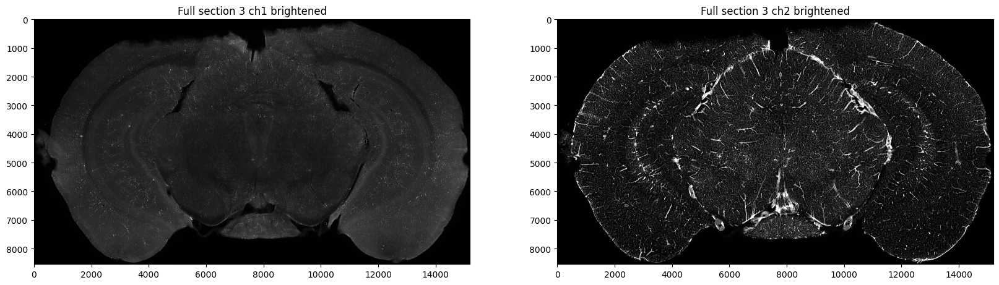

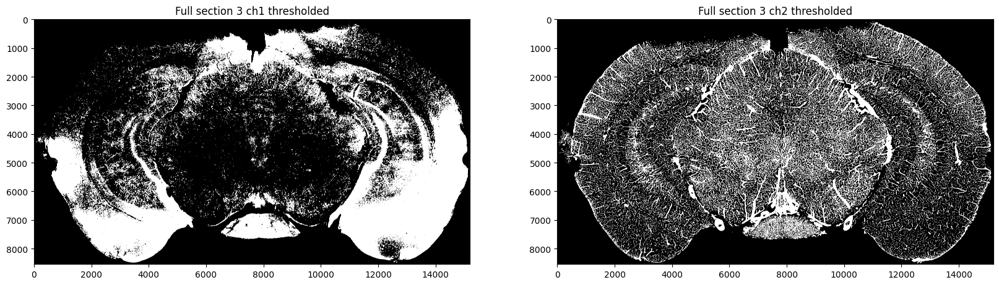

In [45]:
# Ch1 settings
gamma_ch1 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch1 = 0.025  # 2

# Ch2 settings
gamma_ch2 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch2 = 0.06  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default

THRESH = 8000   # Default 10000, 8000 low 9000 mid
THRESH2 = 4200  # Default 4200
CH1_MEDIAN = 5
if IDX == 0:
     THRESH = 8000  # 8000
elif IDX == 1:
     THRESH = 5500  # 5500
elif IDX == 2:
     THRESH = 5000  # 5500
elif IDX == 3:
     THRESH = 5250

# Create a threshold mask for the image
curr_ch1_median = ndimage.median_filter(curr_ch1.copy(), size=5)
curr_ch1_thresh = curr_ch1_median.copy() > THRESH
curr_ch1_thresh[curr_ch1_thresh != 0] = 1
curr_ch1_thresh = curr_ch1_thresh.astype(bool)

curr_ch2_median = ndimage.median_filter(curr_ch2.copy(), size=5)  # Repeat for ch2
curr_ch2_thresh = curr_ch2_median.copy() > THRESH2
curr_ch2_thresh[curr_ch2_thresh != 0] = 1
curr_ch2_thresh = curr_ch2_thresh.astype(bool)

# Create contrast enhanced images
cc_ch1 = gamma_correction(curr_ch1, gamma=gamma_ch1)
cc_ch1 = auto_contrast(cc_ch1, alpha=contrast_alpha_ch1)
cc_ch2 = gamma_correction(curr_ch2, gamma=gamma_ch2)
cc_ch2 = auto_contrast(cc_ch2, alpha=contrast_alpha_ch2)

# Create auto contrast brightened images
auto_ch1 = auto_contrast(curr_ch1, alpha=0.0075)
auto_ch2 = auto_contrast(curr_ch2, alpha=0.007)
auto_ch1_median = ndimage.median_filter(auto_ch1.copy(), size=CH1_MEDIAN) # 5
auto_ch2_median = ndimage.median_filter(auto_ch2.copy(), size=5)

##########################################
# FOV 1
##########################################

show(image=cc_ch1, title=f"Section {IDX} ch1 contrast FOV1", 
     xlim=fov1_xlim, ylim=fov1_ylim,
     image2=cc_ch2, title2=f"Section {IDX} ch2 contrast FOV1", 
     xlim2=fov1_xlim, ylim2=fov1_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV1", 
     xlim=fov1_xlim, ylim=fov1_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV1", 
     xlim2=fov1_xlim, ylim2=fov1_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV1", 
     contour=curr_ch1_thresh, 
     xlim=fov1_xlim, ylim=fov1_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV1", 
     contour2=curr_ch2_thresh, 
     xlim2=fov1_xlim, ylim2=fov1_ylim)

##########################################
# FOV 2
##########################################

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV2", 
     xlim=fov2_xlim, ylim=fov2_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV2", 
     xlim2=fov2_xlim, ylim2=fov2_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV2", 
     contour=curr_ch1_thresh, 
     xlim=fov2_xlim, ylim=fov2_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV2", 
     contour2=curr_ch2_thresh, 
     xlim2=fov2_xlim, ylim2=fov2_ylim)

##########################################
# FOV 3
##########################################

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV3",
     xlim=fov3_xlim, ylim=fov3_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV3", 
     xlim2=fov3_xlim, ylim2=fov3_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV3", 
     contour=curr_ch1_thresh,
     xlim=fov3_xlim, ylim=fov3_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV3", 
     contour2=curr_ch2_thresh, 
     xlim2=fov3_xlim, ylim2=fov3_ylim)

##########################################
# FOV 4
##########################################

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV4",
     xlim=fov4_xlim, ylim=fov4_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV4", 
     xlim2=fov4_xlim, ylim2=fov4_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV4", 
     contour=curr_ch1_thresh,
     xlim=fov4_xlim, ylim=fov4_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV4", 
     contour2=curr_ch2_thresh, 
     xlim2=fov4_xlim, ylim2=fov4_ylim)

##########################################
# FOV 5
##########################################

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV5",
     xlim=fov5_xlim, ylim=fov5_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV5", 
     xlim2=fov5_xlim, ylim2=fov5_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV5", 
     contour=curr_ch1_thresh,
     xlim=fov5_xlim, ylim=fov5_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV5", 
     contour2=curr_ch2_thresh, 
     xlim2=fov5_xlim, ylim2=fov5_ylim)

##########################################
# FOV 6
##########################################

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV6",
     xlim=fov6_xlim, ylim=fov6_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV6", 
     xlim2=fov6_xlim, ylim2=fov6_ylim)

show(image=auto_ch1, title=f"Section {IDX} ch1 brightened FOV6", 
     contour=curr_ch1_thresh,
     xlim=fov6_xlim, ylim=fov6_ylim,
     image2=auto_ch2, title2=f"Section {IDX} ch2 brightened FOV6", 
     contour2=curr_ch2_thresh, 
     xlim2=fov6_xlim, ylim2=fov6_ylim)

##########################################################
# FULL SECTION
##########################################################

show(image=cc_ch1, title=f"Full section {IDX} ch1 contrast", 
     image2=cc_ch2, title2=f"Full section {IDX} ch2 contrast",
     figsize=(20, 10), axis=True)

show(image=auto_ch1, title=f"Full section {IDX} ch1 brightened", 
     image2=auto_ch2, title2=f"Full section {IDX} ch2 brightened",
     figsize=(20, 10), axis=True)

show(image=curr_ch1_thresh, title=f"Full section {IDX} ch1 thresholded", 
     image2=curr_ch2_thresh, title2=f"Full section {IDX} ch2 thresholded",
     figsize=(20, 10), axis=True)

#thresholded_vessels_ch1 = curr_ch1_thresh
#thresholded_vessels_ch2 = curr_ch2_thresh

## Hessian Filter
https://examples.itk.org/src/nonunit/review/segmentbloodvesselswithmultiscalehessianbasedmeasure/documentation

# CHANNEL 1

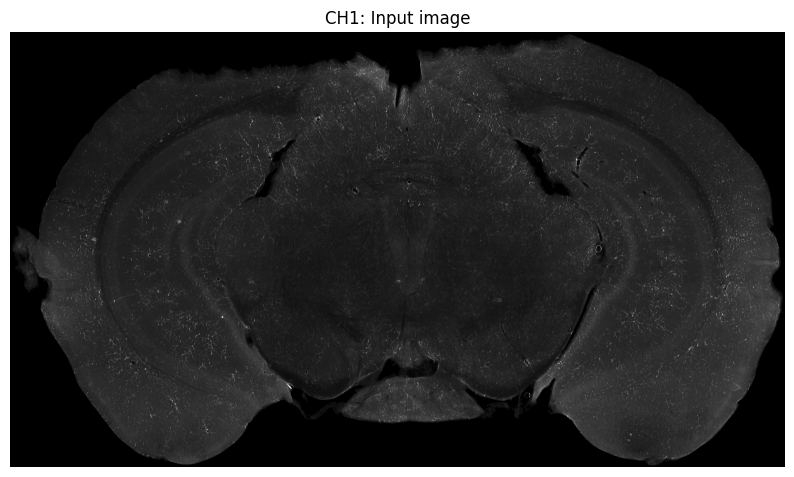

Input image type: float32
Input image min: 0.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (8542, 15202)
Min: 0.0
Max: 255.0
Mean: 146.18997
Median: 224.0
CHANNEL 1


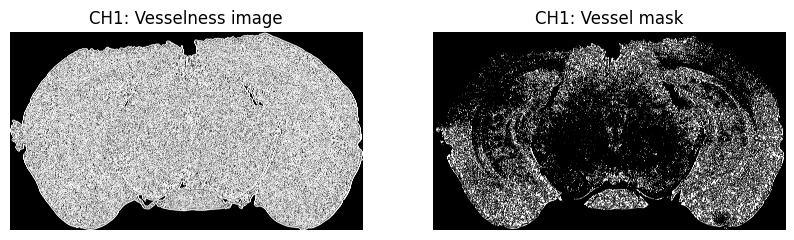

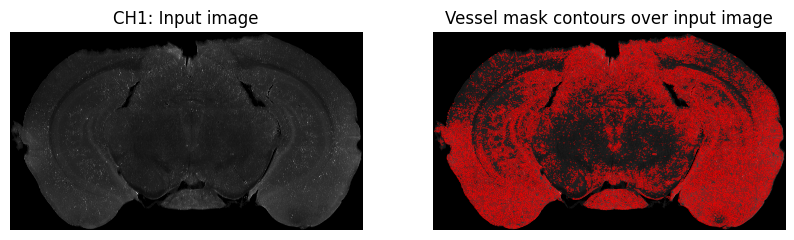

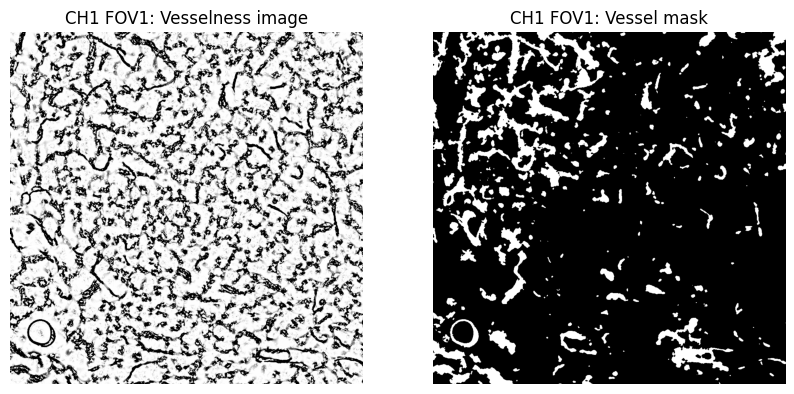

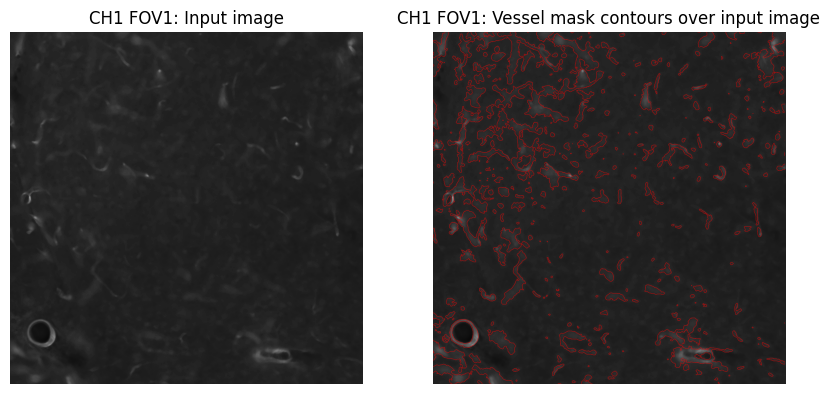

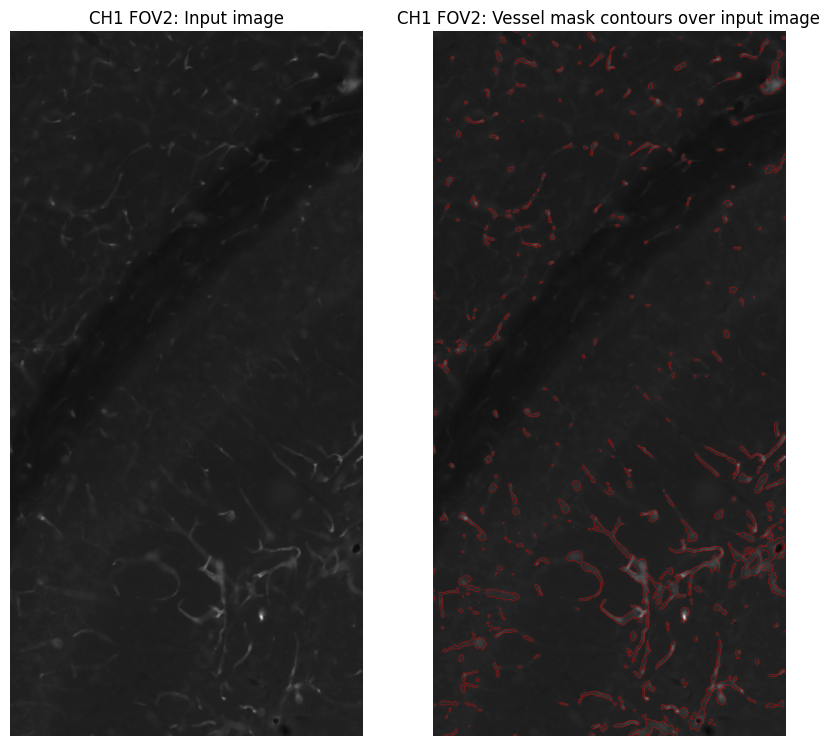

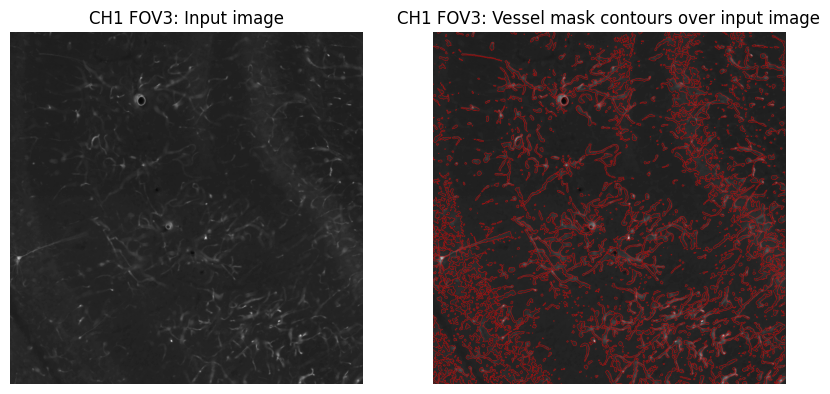

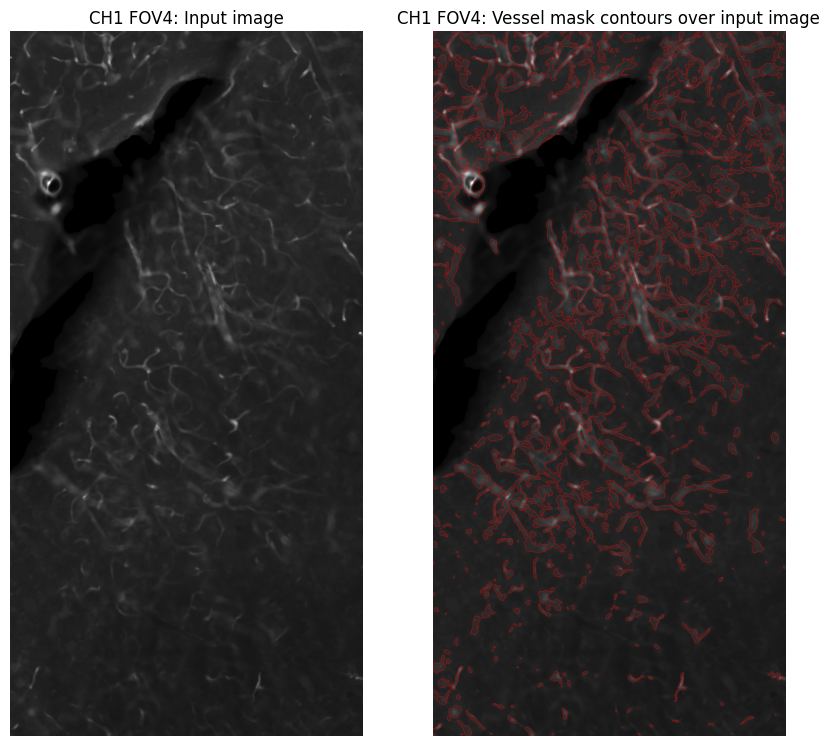

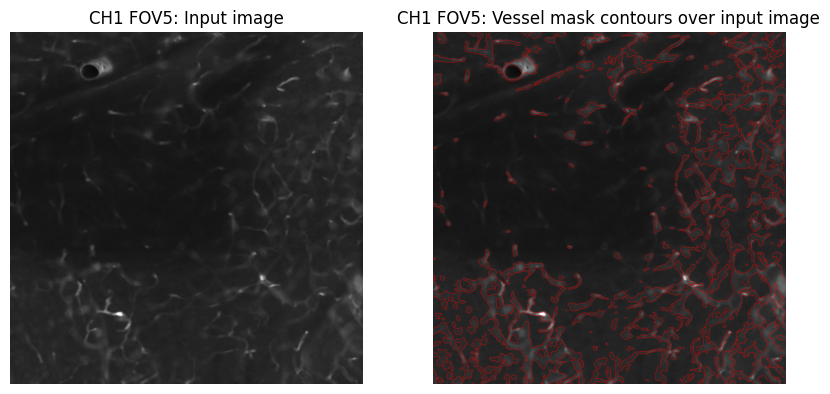

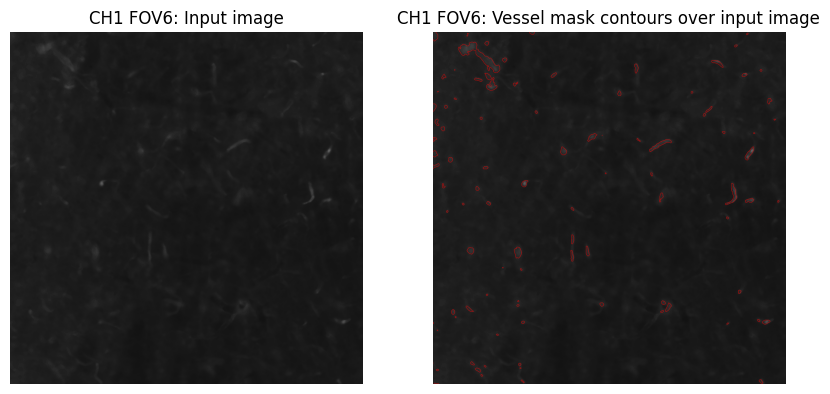

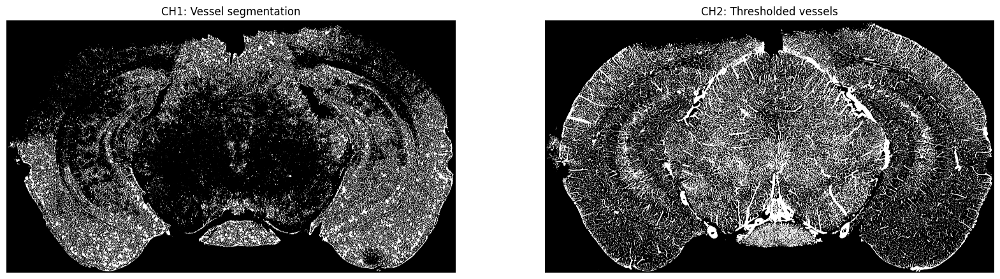

In [46]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230 and 25
min_size = 100  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3

#############################################################

# Alternative: load image in memory
#input_image = contrast_ch2 * bg_mask
#input_image = cc_ch2 * bg_mask
input_image = auto_ch1_median * bg_mask
#input_image = cc_ch1 * bg_mask
input_image = input_image.astype(np.float32)
input_image *= 255.0

show(input_image, title="CH1: Input image", axis=False)

# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels_ch1 = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
thresholded_vessels_ch1 = thresholded_vessels_ch1 * bg_mask * curr_ch1_thresh

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
#print("Std:", segmented_vessels_array.std())

print("CHANNEL 1")

# Plot the raw vesselness image
show(image=segmented_vessels_array, title=f"CH1: Vesselness image",
     image2=thresholded_vessels_ch1, title2=f"CH1: Vessel mask",
     axis=False)

# Show the results
show(image=input_image, title="CH1: Input image",
     image2=input_image, title2="Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     axis=False)

# Plot the raw vesselness image FOV1
show(image=segmented_vessels_array, title=f"CH1 FOV1: Vesselness image",
     image2=thresholded_vessels_ch1, title2=f"CH1 FOV1: Vessel mask",
     xlim=fov1_xlim, ylim=fov1_ylim, xlim2=fov1_xlim, ylim2=fov1_ylim,
     axis=False)


# FOV1
show(image=input_image, title="CH1 FOV1: Input image",
     image2=input_image, title2="CH1 FOV1: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov1_xlim, ylim=fov1_ylim, xlim2=fov1_xlim, ylim2=fov1_ylim,
     axis=False)

# FOV2
show(image=input_image, title="CH1 FOV2: Input image",
     image2=input_image, title2="CH1 FOV2: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov2_xlim, ylim=fov2_ylim, xlim2=fov2_xlim, ylim2=fov2_ylim,
     axis=False)

# FOV3
show(image=input_image, title="CH1 FOV3: Input image",
     image2=input_image, title2="CH1 FOV3: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov3_xlim, ylim=fov3_ylim, xlim2=fov3_xlim, ylim2=fov3_ylim,
     axis=False)

# FOV4
show(image=input_image, title="CH1 FOV4: Input image",
     image2=input_image, title2="CH1 FOV4: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov4_xlim, ylim=fov4_ylim, xlim2=fov4_xlim, ylim2=fov4_ylim,
     axis=False)

# FOV5
show(image=input_image, title="CH1 FOV5: Input image",
     image2=input_image, title2="CH1 FOV5: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov5_xlim, ylim=fov5_ylim, xlim2=fov5_xlim, ylim2=fov5_ylim,
     axis=False)

# FOV6
show(image=input_image, title="CH1 FOV6: Input image",
     image2=input_image, title2="CH1 FOV6: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch1, contour_alpha=0.45,
     xlim=fov6_xlim, ylim=fov6_ylim, xlim2=fov6_xlim, ylim2=fov6_ylim,
     axis=False)

# Full section
show(image=thresholded_vessels_ch1, title="CH1: Vessel segmentation",
     image2=curr_ch2_thresh, title2="CH2: Thresholded vessels",
     figsize=(20, 10), axis=False)

In [47]:
#np.save(f"vessel_mask_ch1.npy", thresholded_vessels_ch1)

# CHANNEL 2

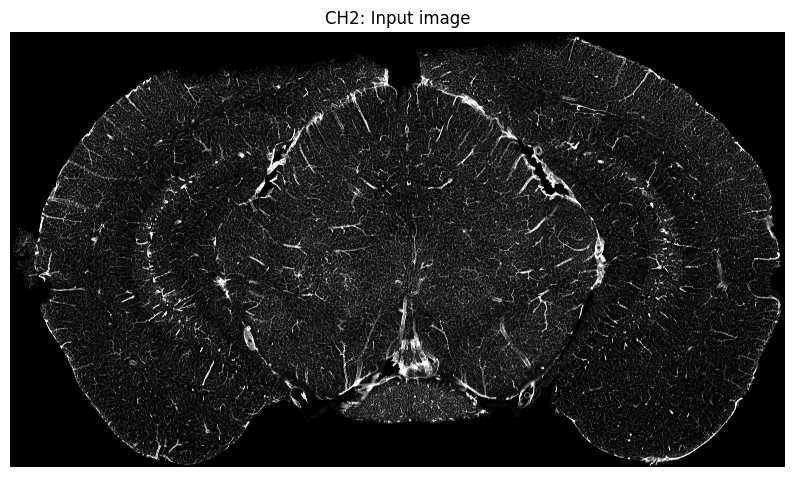

Input image type: float32
Input image min: 0.0
Input image max: 65025.0
Vesselness image statistics:
Shape: (8542, 15202)
Min: 0.0
Max: 255.0
Mean: 147.72205
Median: 234.0
CHANNEL 2


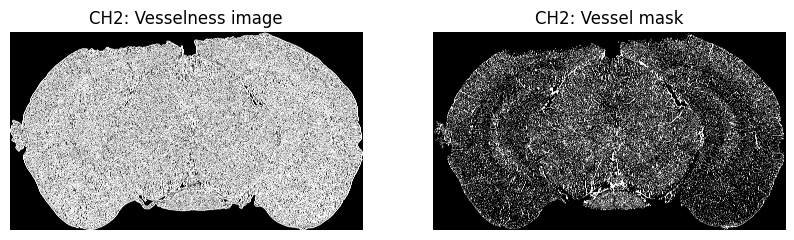

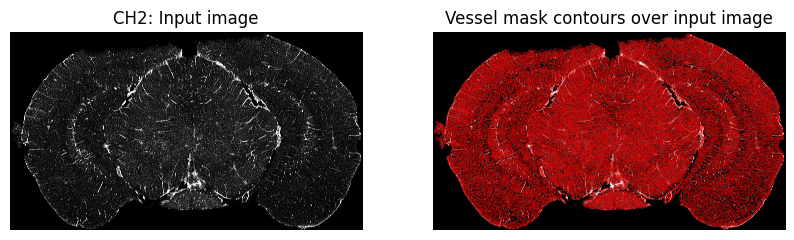

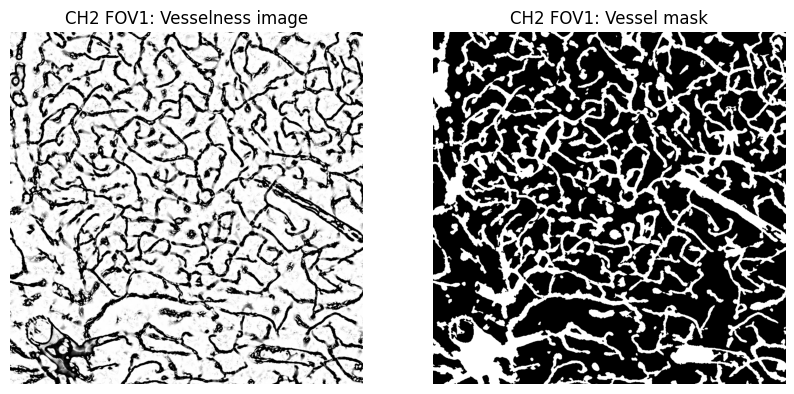

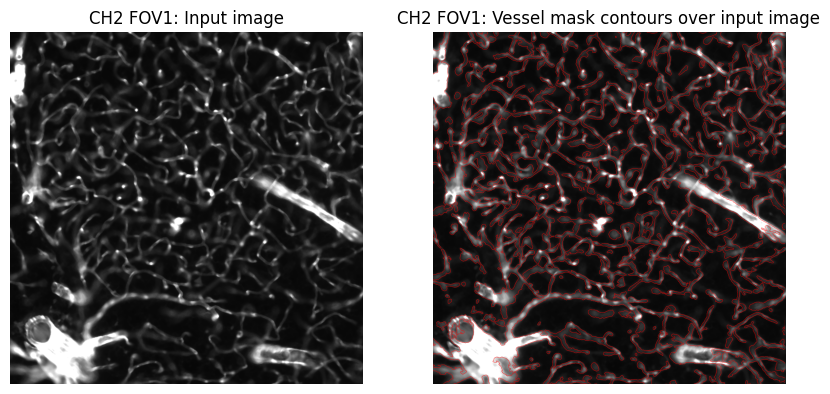

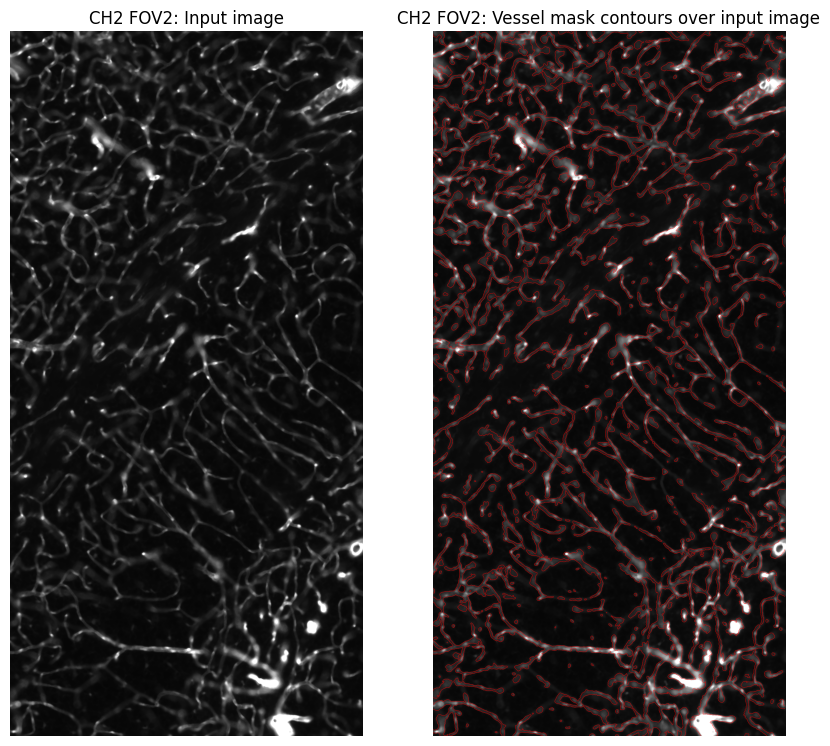

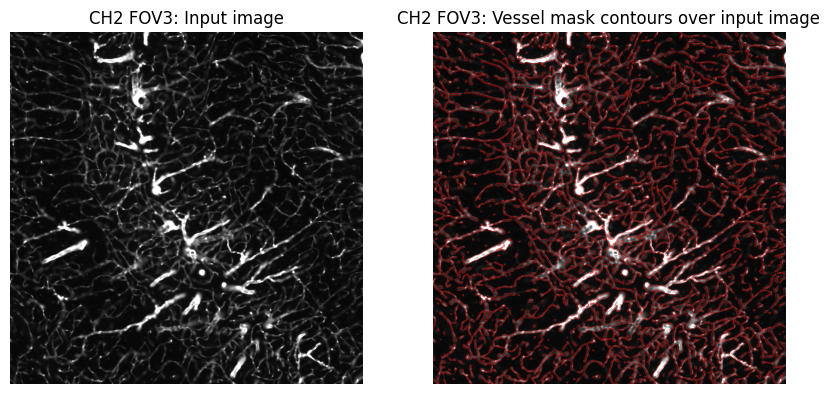

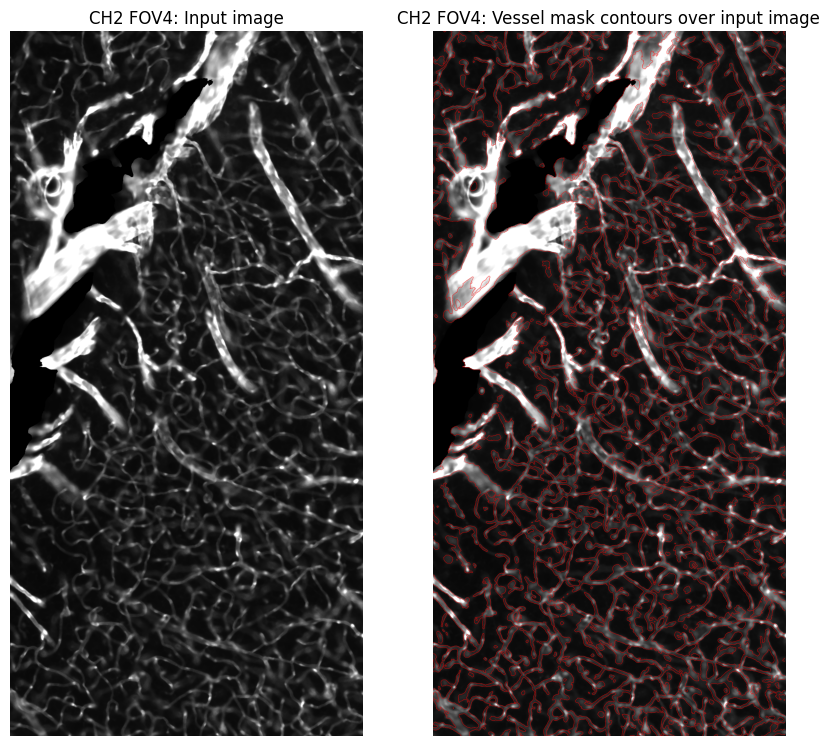

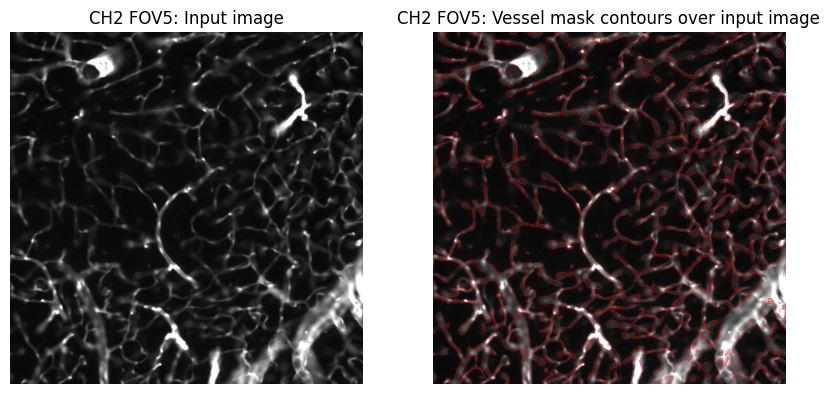

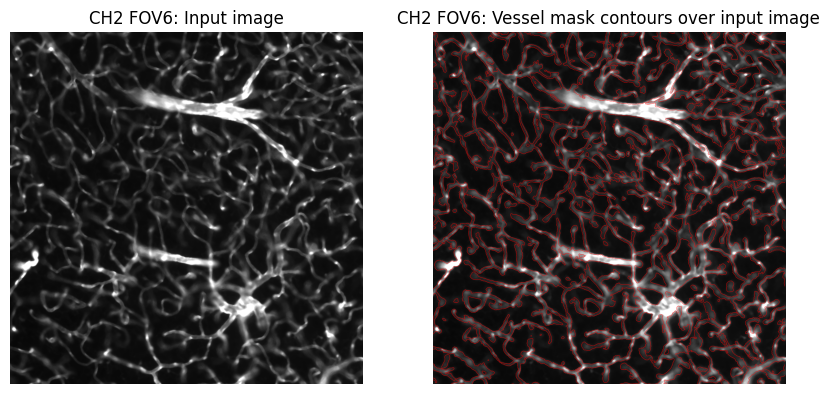

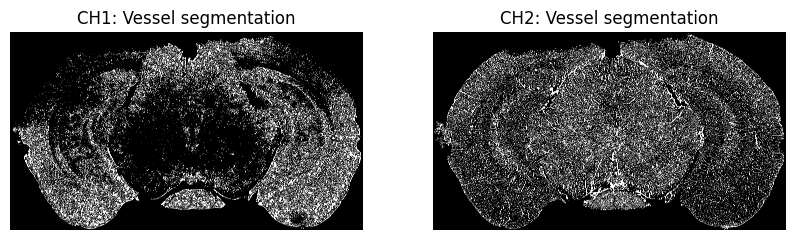

In [48]:
# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 100  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3

#############################################################

# Alternative: load image in memory
input_image = auto_ch2_median * bg_mask
input_image = input_image.astype(np.float32)
input_image *= 255.0

show(input_image, title="CH2: Input image", axis=False)

# Print statistics
print("Input image type:", input_image.dtype)
print("Input image min:", input_image.min())
print("Input image max:", input_image.max())

# Run the vessel detection
segmented_vessels_array = detect_vessels(input_image, sigma_minimum, sigma_maximum, number_of_sigma_steps)

# Process the thresholded vessels
thresholded_vessels_ch2 = process_vessels(segmented_vessels_array, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
thresholded_vessels_ch2 = thresholded_vessels_ch2 * bg_mask * curr_ch2_thresh

# Print statistics
print("Vesselness image statistics:")
print("Shape:", segmented_vessels_array.shape)
print("Min:", segmented_vessels_array.min())
print("Max:", segmented_vessels_array.max())
print("Mean:", segmented_vessels_array.mean())
print("Median:", np.median(segmented_vessels_array))
#print("Std:", segmented_vessels_array.std())

print("CHANNEL 2")

# Plot the raw vesselness image
show(image=segmented_vessels_array, title=f"CH2: Vesselness image",
     image2=thresholded_vessels_ch2, title2=f"CH2: Vessel mask",
     axis=False)

# Show the results
show(image=input_image, title="CH2: Input image",
     image2=input_image, title2="Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     axis=False)

# Plot the raw vesselness image FOV1
show(image=segmented_vessels_array, title=f"CH2 FOV1: Vesselness image",
     image2=thresholded_vessels_ch2, title2=f"CH2 FOV1: Vessel mask",
     xlim=fov1_xlim, ylim=fov1_ylim, xlim2=fov1_xlim, ylim2=fov1_ylim,
     axis=False)


# FOV1
show(image=input_image, title="CH2 FOV1: Input image",
     image2=input_image, title2="CH2 FOV1: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov1_xlim, ylim=fov1_ylim, xlim2=fov1_xlim, ylim2=fov1_ylim,
     axis=False)

# FOV2
show(image=input_image, title="CH2 FOV2: Input image",
     image2=input_image, title2="CH2 FOV2: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov2_xlim, ylim=fov2_ylim, xlim2=fov2_xlim, ylim2=fov2_ylim,
     axis=False)

# FOV3
show(image=input_image, title="CH2 FOV3: Input image",
     image2=input_image, title2="CH2 FOV3: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov3_xlim, ylim=fov3_ylim, xlim2=fov3_xlim, ylim2=fov3_ylim,
     axis=False)

# FOV4
show(image=input_image, title="CH2 FOV4: Input image",
     image2=input_image, title2="CH2 FOV4: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov4_xlim, ylim=fov4_ylim, xlim2=fov4_xlim, ylim2=fov4_ylim,
     axis=False)

# FOV5
show(image=input_image, title="CH2 FOV5: Input image",
     image2=input_image, title2="CH2 FOV5: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov5_xlim, ylim=fov5_ylim, xlim2=fov5_xlim, ylim2=fov5_ylim,
     axis=False)

# FOV6
show(image=input_image, title="CH2 FOV6: Input image",
     image2=input_image, title2="CH2 FOV6: Vessel mask contours over input image",
     contour2=thresholded_vessels_ch2, contour_alpha=0.45,
     xlim=fov6_xlim, ylim=fov6_ylim, xlim2=fov6_xlim, ylim2=fov6_ylim,
     axis=False)

# Full section
show(image=thresholded_vessels_ch1, title="CH1: Vessel segmentation",
     image2=thresholded_vessels_ch2, title2="CH2: Vessel segmentation",
     figsize=(10, 10), axis=False)

## Compute statistics 

i = 0:

Dice coefficient: 0.4255892880657944
IoU score: 0.2703165602468155
Precision score: 0.49302666451598737
Recall score: 0.3743806057335866
SSIM score: 0.7383957115890638
MSE score: 0.13266948814313329
Hamming distance: 0.13266948814313329
Rand index: 0.8673305118568667


i = 1:

Dice coefficient: 0.40934765662764727
IoU score: 0.2573457728417176
Precision score: 0.5390933717282871
Recall score: 0.32993976094718774
SSIM score: 0.6198097857988607
MSE score: 0.19611645444614317
Hamming distance: 0.19611645444614317
Rand index: 0.8038835455538568

i = 2:

Dice coefficient: 0.3443030819308361
IoU score: 0.2079505482998389
Precision score: 0.5200026837415862
Recall score: 0.25734934373888196
SSIM score: 0.6247201391586568
MSE score: 0.20344371333101138
Hamming distance: 0.20344371333101138
Rand index: 0.7965562866689886

i = 3:

Dice coefficient: 0.40861941155276305
IoU score: 0.2567703882522952
Precision score: 0.43946951028383335
Recall score: 0.3818164695783936
SSIM score: 0.582211230168709
MSE score: 0.22051339780151294
Hamming distance: 0.22051339780151294
Rand index: 0.7794866021984871

In [49]:
thresholded_ch0 = thresholded_vessels_ch1
thresholded_ch1 = thresholded_vessels_ch2

# Compute the metrics
dice_score = dice_coefficient(thresholded_ch0, thresholded_ch1)  
iou_score = iou(thresholded_ch0, thresholded_ch1)  # Strongly penalizes over-segmentation and under-segmentation
precision_score = precision(thresholded_ch0, thresholded_ch1) 
recall_score = recall(thresholded_ch0, thresholded_ch1)
ssim_score = ssim(thresholded_ch0, thresholded_ch1)
mse_score = mean_squared_error(thresholded_ch0, thresholded_ch1)
thresh_ch0_flat = thresholded_ch0.flatten()
thresh_ch1_flat = thresholded_ch1.flatten()
hamming_distance = hamming(thresh_ch0_flat, thresh_ch1_flat)
rand_score = rand_index(thresholded_ch0, thresholded_ch1)  # Measures how close points are clustered together

print("Dice coefficient:", dice_score)
print("IoU score:", iou_score)
print("Precision score:", precision_score)
print("Recall score:", recall_score)
print("SSIM score:", ssim_score)
print("MSE score:", mse_score)
print("Hamming distance:", hamming_distance)
print("Rand index:", rand_score)

# Write the solutions to a CSV file
csv_filename = 'stats_enhanced_M72.csv'

# Write to rows
rows = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]
rows.append([IDX, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])

#with open(csv_filename, mode='w', newline='') as file:
#    writer = csv.writer(file)
#    writer.writerows(rows)

Dice coefficient: 0.40861941155276305
IoU score: 0.2567703882522952
Precision score: 0.43946951028383335
Recall score: 0.3818164695783936
SSIM score: 0.582211230168709
MSE score: 0.22051339780151294
Hamming distance: 0.22051339780151294
Rand index: 0.7794866021984871


Run the whole thing

## Threshold method (batch)

In [30]:
from tqdm import tqdm

data_path = "/media/data/u01/Fig4-2/4b-M72/*/*.tif"
output_ch1_path = "/media/data/u01/lightsheet/quant-fig4 - reconverted data/4b-M72/segmentation/ch1/"
output_ch2_path = "/media/data/u01/lightsheet/quant-fig4 - reconverted data/4b-M72/segmentation/ch2/"
output_csv_ch1_ch2_path = "/media/data/u01/lightsheet/quant-fig4 - reconverted data/4b-M72/stats_enhanced2_ch1_ch2.csv"

################################################################################

# Ch1 settings
gamma_ch1 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch1 = 3  # 2

# Ch2 settings
gamma_ch2 = 2  # You can adjust this value to control the contrast enhancement
contrast_alpha_ch2 = 5.325  # Try 0.15 You can adjust this value to control the brightness enhancement 0.5 default

# Parameters for vessel detection
sigma_minimum = 1.0  # Range of scales in which MultiScaleHessianBasedMeasureImageFilter will search for vessels
sigma_maximum = 10.0  # 10
number_of_sigma_steps = 10  # 10 Number of scales to search for vessels

# Parameters for post-processing
thresh = 230  # Threshold for binarization, 230
min_size = 100  # Minimum size of objects to keep
area_threshold = 2000 # Minimum area of holes to keep
smoothing = 1  # Smoothing factor for closing, 3

# Read all tif files in the folder
data_files = sorted(glob.glob(data_path))
num_slices = len(data_files) // 2
rows_ch1_ch2 = [["Index", "Dice coefficient", "IoU score", "Precision", "Recall", "SSIM", "MSE", "Hamming distance", "Rand index"]]

# Load the image channels
for i in tqdm(range(num_slices)):
    curr_ch1, curr_ch2 = load_channels(data_path, i)
    curr_ch1 = curr_ch1.astype(np.float32)
    curr_ch2 = curr_ch2.astype(np.float32)
        
    THRESH = 8000   # Default 10000, 8000 low 9000 mid
    THRESH2 = 4200  # Default 4200
    if i == 0:
        THRESH = 8000  # 8000
    elif i == 1:
        THRESH = 5500  # 5500
    elif i == 2:
        THRESH = 5000  # 5500
    elif i == 3:
        THRESH = 5250

    
    # Create a threshold mask for the image
    curr_ch1_median = ndimage.median_filter(curr_ch1.copy(), size=5)
    curr_ch1_thresh = curr_ch1_median.copy() > THRESH
    curr_ch1_thresh[curr_ch1_thresh != 0] = 1
    curr_ch1_thresh = curr_ch1_thresh.astype(bool)

    curr_ch2_median = ndimage.median_filter(curr_ch2.copy(), size=5)  # Repeat for ch2
    curr_ch2_thresh = curr_ch2_median.copy() > THRESH2
    curr_ch2_thresh[curr_ch2_thresh != 0] = 1
    curr_ch2_thresh = curr_ch2_thresh.astype(bool)

    auto_ch1 = auto_contrast(curr_ch1, alpha=0.0075)
    auto_ch1_median = ndimage.median_filter(auto_ch1.copy(), size=5)

    auto_ch2 = auto_contrast(curr_ch2, alpha=0.007)
    auto_ch2_median = ndimage.median_filter(auto_ch2.copy(), size=5)


    """
    # Compute the original image contrast
    contrast_ch1 = curr_ch1
    contrast_ch2 = curr_ch2
    
    if i != 9999:
        bg_alpha = 1
    else:
        bg_alpha = 0.25
    bg_mask = auto_contrast(curr_ch1, alpha=bg_alpha)
    bg_mask = get_brain_mask(bg_mask, area_threshold=25000)
    
    #############################################################

    # Load image in memory
    #input_ch0 = contrast_ch0 * bg_mask
    #input_ch0 = input_ch0.astype(np.float32)
    #input_ch0 *= 255.0
    
    input_ch1 = contrast_ch1 * bg_mask
    input_ch1 = input_ch1.astype(np.float32)
    input_ch1 *= 255.0
    """
    
    if i == 99999: 
        bg_alpha = 0.25
    else:
        bg_alpha = 0.2  #
    bg_mask = auto_contrast(curr_ch1, alpha=bg_alpha)  # 


    bg_mask = get_brain_mask(bg_mask, area_threshold=25000)  # 255 default ch0, 150 for ch1
    
    input_ch1 = auto_ch1_median * bg_mask
    input_ch1 = input_ch1.astype(np.float32)
    input_ch1 *= 255.0
        
    input_ch2 = auto_ch2_median * bg_mask
    input_ch2 = input_ch2.astype(np.float32)
    input_ch2 *= 255.0

    # Run the vessel detection
    #segmented_vessels_ch0 = detect_vessels(input_ch0, sigma_minimum, sigma_maximum, number_of_sigma_steps)
    segmented_vessels_ch1 = detect_vessels(input_ch1, sigma_minimum, sigma_maximum, number_of_sigma_steps)
    segmented_vessels_ch2 = detect_vessels(input_ch2, sigma_minimum, sigma_maximum, number_of_sigma_steps)

    # Process the thresholded vessels
    #thresholded_vessels_ch0 = process_vessels(segmented_vessels_ch0, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
    thresholded_vessels_ch1 = process_vessels(segmented_vessels_ch1, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)
    thresholded_vessels_ch2 = process_vessels(segmented_vessels_ch2, thresh=thresh, min_size=min_size, area_threshold=area_threshold, smoothing=smoothing)

    #thresholded_vessels_ch0 = thresholded_vessels_ch0 * bg_mask
    thresholded_vessels_ch1 = thresholded_vessels_ch1 * bg_mask * curr_ch1_thresh
    thresholded_vessels_ch2 = thresholded_vessels_ch2 * bg_mask * curr_ch2_thresh
    
    #thresholded_vessels_ch1 = curr_ch1_thresh
    #thresholded_vessels_ch2 = curr_ch2_thresh
    
    # Save to file
    sitk_ch1 = sitk.GetImageFromArray(thresholded_vessels_ch1.astype(np.uint8))  # Ch1
    output_ch1_file = output_ch1_path + f"ch1_seg_{str(i).zfill(4)}.tif"
    sitk.WriteImage(sitk_ch1, output_ch1_file)
    sitk_ch2 = sitk.GetImageFromArray(thresholded_vessels_ch2.astype(np.uint8))  # Ch1
    output_ch2_file = output_ch2_path + f"ch2_seg_{str(i).zfill(4)}.tif"
    sitk.WriteImage(sitk_ch2, output_ch2_file)
    
    # Compute statistics between ch1 and ch2
    thresh_ch1_flat = thresholded_vessels_ch1.flatten()
    thresh_ch2_flat = thresholded_vessels_ch2.flatten()
    dice_score = dice_coefficient(thresholded_vessels_ch1, thresholded_vessels_ch2)  
    iou_score = iou(thresholded_vessels_ch1, thresholded_vessels_ch2)  # Strongly penalizes over-segmentation and under-segmentation
    precision_score = precision(thresholded_vessels_ch1, thresholded_vessels_ch2) 
    recall_score = recall(thresholded_vessels_ch1, thresholded_vessels_ch2)
    ssim_score = ssim(thresholded_vessels_ch1, thresholded_vessels_ch2)
    mse_score = mean_squared_error(thresholded_vessels_ch1, thresholded_vessels_ch2)
    hamming_distance = hamming(thresh_ch1_flat, thresh_ch2_flat)
    rand_score = rand_index(thresholded_vessels_ch1, thresholded_vessels_ch2)  # Measures how close points are clustered together
    rows_ch1_ch2.append([i, dice_score, iou_score, precision_score, recall_score, ssim_score, mse_score, hamming_distance, rand_score])
    print("ch1-ch2:", rows_ch1_ch2[i + 1])

with open(output_csv_ch1_ch2_path, mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(rows_ch1_ch2)

  0%|          | 0/4 [00:00<?, ?it/s]

Found 4 slices
['/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif']


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.



Ch1: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif
Ch2: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif

Channel shape: (6655, 9130)
Channel dtype: uint16
Channel 1 min: 0
Channel 1 max: 65535
Channel 1 mean: 3859.769175586301


 25%|██▌       | 1/4 [01:54<05:44, 114.69s/it]

ch1-ch2: [0, 0.4255892880657944, 0.2703165602468155, 0.49302666451598737, 0.3743806057335866, 0.7383957115890638, 0.13266948814313329, 0.13266948814313329, 0.8673305118568667]
Found 4 slices
['/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif']


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.



Ch1: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif
Ch2: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif

Channel shape: (8182, 11784)
Channel dtype: uint16
Channel 1 min: 1
Channel 1 max: 65535
Channel 1 mean: 3700.583229295327


 50%|█████     | 2/4 [05:04<05:17, 158.88s/it]

ch1-ch2: [1, 0.40934765662764727, 0.2573457728417176, 0.5390933717282871, 0.32993976094718774, 0.6198097857988607, 0.19611645444614317, 0.19611645444614317, 0.8038835455538568]
Found 4 slices
['/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif']


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.



Ch1: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif
Ch2: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif

Channel shape: (9989, 14715)
Channel dtype: uint16
Channel 1 min: 0
Channel 1 max: 65535
Channel 1 mean: 3038.6829530628443


 75%|███████▌  | 3/4 [09:59<03:41, 221.02s/it]

ch1-ch2: [2, 0.3443030819308361, 0.2079505482998389, 0.5200026837415862, 0.25734934373888196, 0.6247201391586568, 0.20344371333101138, 0.20344371333101138, 0.7965562866689886]
Found 4 slices
['/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 1/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 2/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 3/CH2.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif',
 '/media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif']


TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.
TIFFReadDirectory: Warning, Unknown field with tag 33560 (0x8318) encountered.



Ch1: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH1.tif
Ch2: /media/data/u01/Fig4-2/4b-M72/Fig4b_M72_slice 4/CH2.tif

Channel shape: (8542, 15202)
Channel dtype: uint16
Channel 1 min: 0
Channel 1 max: 65535
Channel 1 mean: 3927.295233053076


100%|██████████| 4/4 [14:19<00:00, 214.94s/it]

ch1-ch2: [3, 0.40861941155276305, 0.2567703882522952, 0.43946951028383335, 0.3818164695783936, 0.582211230168709, 0.22051339780151294, 0.22051339780151294, 0.7794866021984871]


In [48]:
"""
i=0 should match:

"""

'\ni=0 should match:\n\nDice coefficient: 0.20861701962022924\nIoU score: 0.11645584551439844\nPrecision score: 0.6523540721051049\nRecall score: 0.12416135776174236\nSSIM score: 0.714654950275407\nMSE score: 0.14988561230351202\nHamming distance: 0.14988561230351202\nRand index: 0.850114387696488\n'